In [12]:
import os
import torch
import pandas as pd
from PIL import Image
from sklearn.model_selection import train_test_split
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as transforms

In [13]:
def load_data(txt_path, img_dir):
    with open(txt_path, 'r') as f:
        lines = f.readlines()
    data = []
    for line in lines:
        filename, angle = line.strip().split()
        data.append((os.path.join(img_dir, filename), float(angle)))
    return pd.DataFrame(data, columns=["image_path", "angle"])

transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize([0.5]*3, [0.5]*3)
])

In [14]:
class SteeringDataset(Dataset):
    def __init__(self, dataframe, transform=None):
        self.df = dataframe.reset_index(drop=True)
        self.transform = transform

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        img_path = self.df.loc[idx, "image_path"]
        angle = self.df.loc[idx, "angle"]
        image = Image.open(img_path).convert("RGB")
        if self.transform:
            image = self.transform(image)
        angle = torch.tensor(angle, dtype=torch.float32)  # <- fix is here
        return image, angle

In [15]:
df = load_data("source_b/labels.txt", "source_b/images")
train_df, val_df = train_test_split(df, test_size=0.2, random_state=42)

train_dataset = SteeringDataset(train_df, transform)
val_dataset = SteeringDataset(val_df, transform)

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=32)

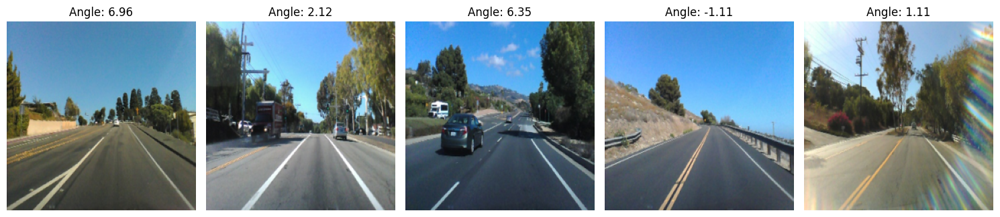

In [16]:
import matplotlib.pyplot as plt
import torchvision.transforms.functional as F

images, angles = next(iter(train_loader))

images = images * 0.5 + 0.5  

plt.figure(figsize=(15, 5))
for i in range(min(5, len(images))): 
    img = F.to_pil_image(images[i])
    plt.subplot(1, 5, i+1)
    plt.imshow(img)
    plt.title(f"Angle: {angles[i]:.2f}")
    plt.axis("off")
plt.tight_layout()
plt.show()

# custom cnn

In [17]:
import torch
import torch.nn as nn
import torch.nn.functional as F

class SimpleCNN(nn.Module):
    def __init__(self):
        super(SimpleCNN, self).__init__()
        
        self.conv_layers = nn.Sequential(
            nn.Conv2d(3, 16, kernel_size=5, stride=2, padding=2),  # (B, 16, 112, 112)
            nn.ReLU(),
            nn.Conv2d(16, 32, kernel_size=5, stride=2, padding=2), # (B, 32, 56, 56)
            nn.ReLU(),
            nn.Conv2d(32, 64, kernel_size=5, stride=2, padding=2), # (B, 64, 28, 28)
            nn.ReLU(),
            nn.Conv2d(64, 128, kernel_size=5, stride=2, padding=2), # (B, 128, 14, 14)
            nn.ReLU(),
        )
        
        self.fc_layers = nn.Sequential(
            nn.Flatten(),                      
            nn.Linear(128 * 14 * 14, 256),
            nn.ReLU(),
            nn.Linear(256, 1)                  
        )

    def forward(self, x):
        x = self.conv_layers(x)
        x = self.fc_layers(x)
        return x

In [18]:
model = SimpleCNN()
print(model)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = model.to(device)

SimpleCNN(
  (conv_layers): Sequential(
    (0): Conv2d(3, 16, kernel_size=(5, 5), stride=(2, 2), padding=(2, 2))
    (1): ReLU()
    (2): Conv2d(16, 32, kernel_size=(5, 5), stride=(2, 2), padding=(2, 2))
    (3): ReLU()
    (4): Conv2d(32, 64, kernel_size=(5, 5), stride=(2, 2), padding=(2, 2))
    (5): ReLU()
    (6): Conv2d(64, 128, kernel_size=(5, 5), stride=(2, 2), padding=(2, 2))
    (7): ReLU()
  )
  (fc_layers): Sequential(
    (0): Flatten(start_dim=1, end_dim=-1)
    (1): Linear(in_features=25088, out_features=256, bias=True)
    (2): ReLU()
    (3): Linear(in_features=256, out_features=1, bias=True)
  )
)


In [39]:
import torch
import torch.nn as nn
import torch.optim as optim

model = SimpleCNN().to(device)

criterion = nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=1e-4)

num_epochs = 10

for epoch in range(num_epochs):
    model.train()
    running_loss = 0.0

    for i, (images, angles) in enumerate(train_loader):
        images = images.to(device)
        angles = angles.to(device).unsqueeze(1)

        outputs = model(images)
        loss = criterion(outputs, angles)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        running_loss += loss.item() * images.size(0)

        if i % 10 == 0:
            print(f"[Epoch {epoch+1} | Batch {i}] Loss: {loss.item():.4f}")

    epoch_loss = running_loss / len(train_loader.dataset)

    model.eval()
    val_loss = 0.0
    with torch.no_grad():
        for images, angles in val_loader:
            images = images.to(device)
            angles = angles.to(device).unsqueeze(1)
            outputs = model(images)
            loss = criterion(outputs, angles)
            val_loss += loss.item() * images.size(0)

    val_loss /= len(val_loader.dataset)

    print(f"Epoch {epoch+1}/{num_epochs} - Train Loss: {epoch_loss:.4f}, Val Loss: {val_loss:.4f}")

[Epoch 1 | Batch 0] Loss: 107.1255
[Epoch 1 | Batch 10] Loss: 115.2482
[Epoch 1 | Batch 20] Loss: 1848.6799
[Epoch 1 | Batch 30] Loss: 704.7565
[Epoch 1 | Batch 40] Loss: 1723.9114
[Epoch 1 | Batch 50] Loss: 1242.5088
[Epoch 1 | Batch 60] Loss: 1443.5388
[Epoch 1 | Batch 70] Loss: 2029.4109
[Epoch 1 | Batch 80] Loss: 1226.3687
[Epoch 1 | Batch 90] Loss: 179.5752
[Epoch 1 | Batch 100] Loss: 288.0584
[Epoch 1 | Batch 110] Loss: 1067.9330
[Epoch 1 | Batch 120] Loss: 703.7546
[Epoch 1 | Batch 130] Loss: 453.5577
[Epoch 1 | Batch 140] Loss: 1146.2183
[Epoch 1 | Batch 150] Loss: 205.6339
[Epoch 1 | Batch 160] Loss: 485.5912
[Epoch 1 | Batch 170] Loss: 371.1164
[Epoch 1 | Batch 180] Loss: 1204.6509
[Epoch 1 | Batch 190] Loss: 255.7274
[Epoch 1 | Batch 200] Loss: 1160.6398
[Epoch 1 | Batch 210] Loss: 177.8502
[Epoch 1 | Batch 220] Loss: 573.9124
[Epoch 1 | Batch 230] Loss: 229.9117
[Epoch 1 | Batch 240] Loss: 354.9343
[Epoch 1 | Batch 250] Loss: 3720.5068
[Epoch 1 | Batch 260] Loss: 1933.3083


In [43]:
torch.save(model.state_dict(), 'simple_cnn.pth')

In [19]:
# Make sure the class definition is present
class SimpleCNN(nn.Module):
    def __init__(self):
        super(SimpleCNN, self).__init__()
        self.conv_layers = nn.Sequential(
            nn.Conv2d(3, 16, kernel_size=5, stride=2, padding=2),
            nn.ReLU(),
            nn.Conv2d(16, 32, kernel_size=5, stride=2, padding=2),
            nn.ReLU(),
            nn.Conv2d(32, 64, kernel_size=5, stride=2, padding=2),
            nn.ReLU(),
            nn.Conv2d(64, 128, kernel_size=5, stride=2, padding=2),
            nn.ReLU(),
        )
        self.fc_layers = nn.Sequential(
            nn.Flatten(),
            nn.Linear(128 * 14 * 14, 256),
            nn.ReLU(),
            nn.Linear(256, 1)
        )

    def forward(self, x):
        x = self.conv_layers(x)
        x = self.fc_layers(x)
        return x

# Instantiate and load weights
model = SimpleCNN().to(device)
model.load_state_dict(torch.load('simple_cnn.pth'))
model.eval()

SimpleCNN(
  (conv_layers): Sequential(
    (0): Conv2d(3, 16, kernel_size=(5, 5), stride=(2, 2), padding=(2, 2))
    (1): ReLU()
    (2): Conv2d(16, 32, kernel_size=(5, 5), stride=(2, 2), padding=(2, 2))
    (3): ReLU()
    (4): Conv2d(32, 64, kernel_size=(5, 5), stride=(2, 2), padding=(2, 2))
    (5): ReLU()
    (6): Conv2d(64, 128, kernel_size=(5, 5), stride=(2, 2), padding=(2, 2))
    (7): ReLU()
  )
  (fc_layers): Sequential(
    (0): Flatten(start_dim=1, end_dim=-1)
    (1): Linear(in_features=25088, out_features=256, bias=True)
    (2): ReLU()
    (3): Linear(in_features=256, out_features=1, bias=True)
  )
)

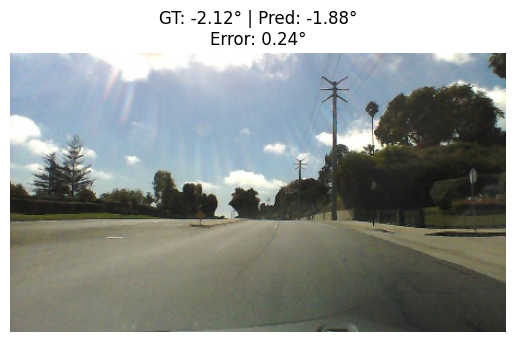

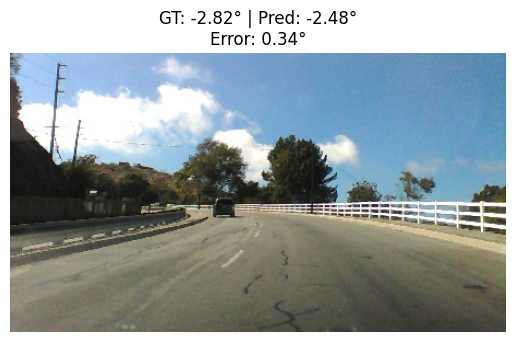

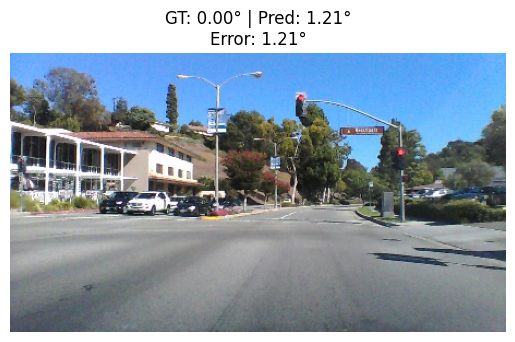

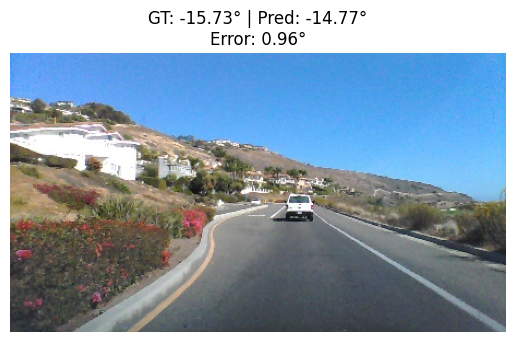

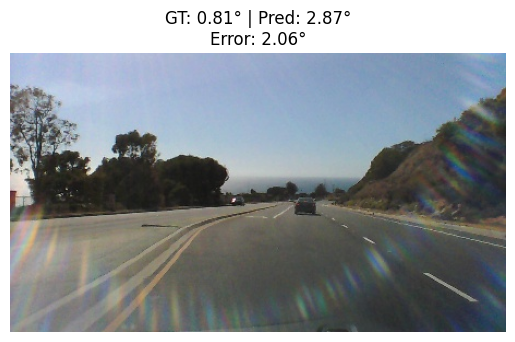

In [21]:
import matplotlib.pyplot as plt
import torchvision.transforms as transforms
from PIL import Image
import torch

model.eval()

transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize([0.5]*3, [0.5]*3)
])

num_samples = 5
for i in range(num_samples):
    img_path = val_df.iloc[i]["image_path"]
    true_angle = val_df.iloc[i]["angle"]

    image = Image.open(img_path).convert("RGB")
    input_tensor = transform(image).unsqueeze(0).to(device)

    with torch.no_grad():
        predicted_angle = model(input_tensor).item()

    error = abs(predicted_angle - true_angle)

    plt.figure()
    plt.imshow(image)
    plt.title(f"GT: {true_angle:.2f}° | Pred: {predicted_angle:.2f}°\nError: {error:.2f}°")
    plt.axis("off")
    plt.show()

# Loading Source A to see how well the model is generalized

In [22]:
def load_data_source_a(txt_path, img_dir):
    data = []
    with open(txt_path, 'r') as f:
        for line in f:
            try:
                filename, rest = line.strip().split()
                angle_str = rest.split(',')[0]  # Take angle before the comma
                angle = float(angle_str)
                data.append((os.path.join(img_dir, filename), angle))
            except Exception as e:
                #print(f"Skipping line due to error: {line.strip()} | {e}")
                continue
    return pd.DataFrame(data, columns=["image_path", "angle"])
    
class SteeringDataset(Dataset):
    def __init__(self, dataframe, transform=None):
        self.df = dataframe.reset_index(drop=True)
        self.transform = transform

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        img_path = self.df.loc[idx, "image_path"]
        angle = self.df.loc[idx, "angle"]
        image = Image.open(img_path).convert("RGB")
        if self.transform:
            image = self.transform(image)
        angle = torch.tensor(angle, dtype=torch.float32) 
        return image, angle
        
source_a_df = load_data_source_a("source_a/labels.txt", "source_a/images")
source_a_train_df, source_a_val_df = train_test_split(df, test_size=0.2, random_state=42)

source_a_train_dataset = SteeringDataset(train_df, transform)
source_a_val_dataset = SteeringDataset(val_df, transform)

source_a_train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
source_a_val_loader = DataLoader(val_dataset, batch_size=32)

Test on Source A — MAE: 3.1561, RMSE: 9.5072


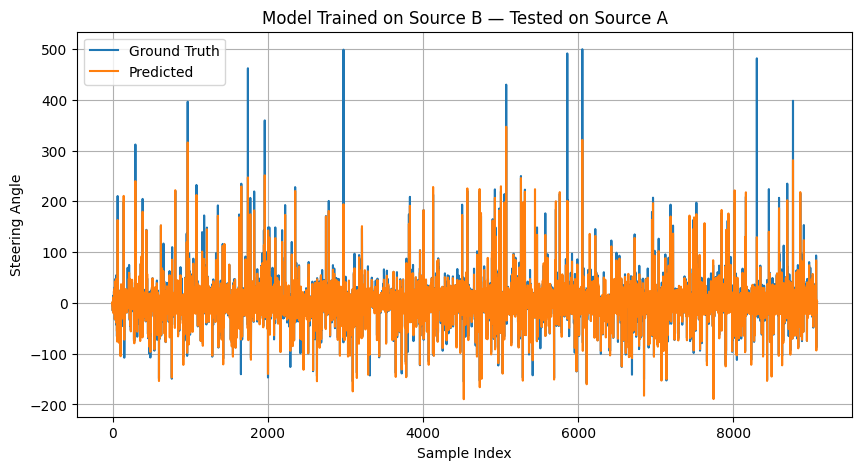

In [23]:
from sklearn.metrics import mean_absolute_error, mean_squared_error
model.eval()

true_angles = []
pred_angles = []

with torch.no_grad():
    for images, angles in source_a_val_loader:
        images = images.to(device)
        angles = angles.numpy()
        outputs = model(images).squeeze(1).cpu().numpy()

        true_angles.extend(angles)
        pred_angles.extend(outputs)

mae = mean_absolute_error(true_angles, pred_angles)
mse = mean_squared_error(true_angles, pred_angles)
rmse = mse ** 0.5

print(f"Test on Source A — MAE: {mae:.4f}, RMSE: {rmse:.4f}")

plt.figure(figsize=(10, 5))
plt.plot(true_angles, label="Ground Truth")
plt.plot(pred_angles, label="Predicted")
plt.title("Model Trained on Source B — Tested on Source A")
plt.xlabel("Sample Index")
plt.ylabel("Steering Angle")
plt.legend()
plt.grid(True)
plt.show()

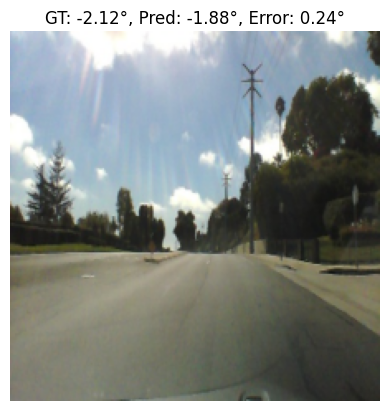

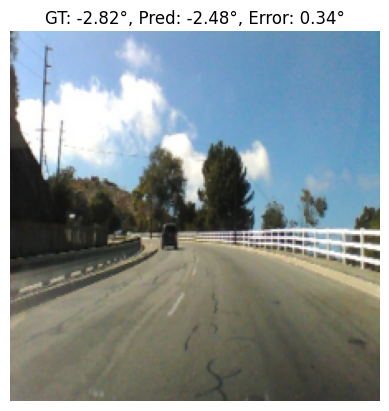

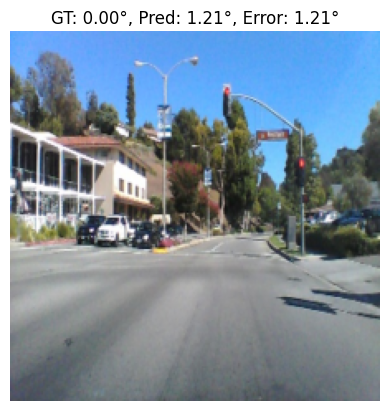

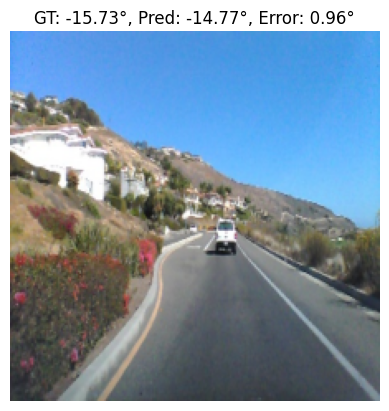

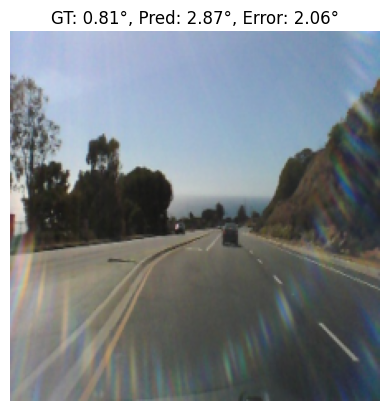

In [24]:
import matplotlib.pyplot as plt
import torchvision.transforms.functional as F
import torch

model.eval()

# How many images to show
num_images = 5
shown = 0

with torch.no_grad():
    for images, angles in source_a_val_loader:
        images = images.to(device)
        outputs = model(images).squeeze(1).cpu()
        angles = angles.cpu()

        for i in range(images.size(0)):
            if shown >= num_images:
                break

            img = F.to_pil_image(images[i] * 0.5 + 0.5)  # unnormalize for display
            true_angle = angles[i].item()
            pred_angle = outputs[i].item()
            error = abs(pred_angle - true_angle)

            plt.figure()
            plt.imshow(img)
            plt.title(f"GT: {true_angle:.2f}°, Pred: {pred_angle:.2f}°, Error: {error:.2f}°")
            plt.axis("off")
            plt.show()

            shown += 1
        if shown >= num_images:
            break

# ViT Regressor

In [64]:
import timm
import torch.nn as nn

class ViTRegressor(nn.Module):
    def __init__(self):
        super().__init__()
        self.backbone = timm.create_model('vit_base_patch16_224', pretrained=True, num_classes=0)
        self.head = nn.Linear(self.backbone.num_features, 1)

    def forward(self, x):
        x = self.backbone(x)
        return self.head(x)

In [67]:
vit_model = ViTRegressor().to(device)  # or SwinRegressor()

# Optionally freeze backbone
for param in vit_model.backbone.parameters():
    param.requires_grad = False

optimizer = torch.optim.Adam(vit_model.head.parameters(), lr=1e-4)
criterion = nn.MSELoss()

In [68]:
for epoch in range(num_epochs):
    vit_model.train()
    train_loss = 0.0

    print(f"\nEpoch {epoch+1}/{num_epochs}")
    for batch_idx, (images, angles) in enumerate(train_loader):
        images = images.to(device)
        angles = angles.to(device).unsqueeze(1)

        optimizer.zero_grad()
        outputs = vit_model(images)
        loss = criterion(outputs, angles)
        loss.backward()
        optimizer.step()

        batch_loss = loss.item()
        train_loss += batch_loss * images.size(0)

        print(f"[Batch {batch_idx+1}/{len(train_loader)}] Train Loss: {batch_loss:.4f}")

    train_loss /= len(train_loader.dataset)
    train_losses.append(train_loss)

    # Validation
    vit_model.eval()
    val_loss = 0.0
    with torch.no_grad():
        for images, angles in val_loader:
            images = images.to(device)
            angles = angles.to(device).unsqueeze(1)

            outputs = vit_model(images)
            loss = criterion(outputs, angles)
            val_loss += loss.item() * images.size(0)

    val_loss /= len(val_loader.dataset)
    val_losses.append(val_loss)

    print(f">>> Epoch {epoch+1} Summary - Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}")


Epoch 1/10
[Batch 1/1136] Train Loss: 874.4489
[Batch 2/1136] Train Loss: 152.8679
[Batch 3/1136] Train Loss: 233.1657
[Batch 4/1136] Train Loss: 609.1277
[Batch 5/1136] Train Loss: 594.5685
[Batch 6/1136] Train Loss: 1793.0836
[Batch 7/1136] Train Loss: 2570.8950
[Batch 8/1136] Train Loss: 5521.8555
[Batch 9/1136] Train Loss: 954.5353
[Batch 10/1136] Train Loss: 301.6382
[Batch 11/1136] Train Loss: 1139.4510
[Batch 12/1136] Train Loss: 970.0092
[Batch 13/1136] Train Loss: 568.3186
[Batch 14/1136] Train Loss: 1092.4601
[Batch 15/1136] Train Loss: 553.4323
[Batch 16/1136] Train Loss: 1367.5513
[Batch 17/1136] Train Loss: 1155.5991
[Batch 18/1136] Train Loss: 1137.0728
[Batch 19/1136] Train Loss: 1576.0178
[Batch 20/1136] Train Loss: 1727.3715
[Batch 21/1136] Train Loss: 836.6726
[Batch 22/1136] Train Loss: 173.7203
[Batch 23/1136] Train Loss: 506.4109
[Batch 24/1136] Train Loss: 1342.8926
[Batch 25/1136] Train Loss: 604.3419
[Batch 26/1136] Train Loss: 344.3961
[Batch 27/1136] Train Lo

In [70]:
torch.save(vit_model.state_dict(), "model_vit_sourceb.pth")  # name it based on model and dataset

# ViTRegressor definition must be included here again if in a new session
vit_model = ViTRegressor().to(device)
vit_model.load_state_dict(torch.load("model_vit_sourceb.pth"))
vit_model.eval()

ViTRegressor(
  (backbone): VisionTransformer(
    (patch_embed): PatchEmbed(
      (proj): Conv2d(3, 768, kernel_size=(16, 16), stride=(16, 16))
      (norm): Identity()
    )
    (pos_drop): Dropout(p=0.0, inplace=False)
    (patch_drop): Identity()
    (norm_pre): Identity()
    (blocks): Sequential(
      (0): Block(
        (norm1): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
        (attn): Attention(
          (qkv): Linear(in_features=768, out_features=2304, bias=True)
          (q_norm): Identity()
          (k_norm): Identity()
          (attn_drop): Dropout(p=0.0, inplace=False)
          (proj): Linear(in_features=768, out_features=768, bias=True)
          (proj_drop): Dropout(p=0.0, inplace=False)
        )
        (ls1): Identity()
        (drop_path1): Identity()
        (norm2): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
        (mlp): Mlp(
          (fc1): Linear(in_features=768, out_features=3072, bias=True)
          (act): GELU(approximate='non

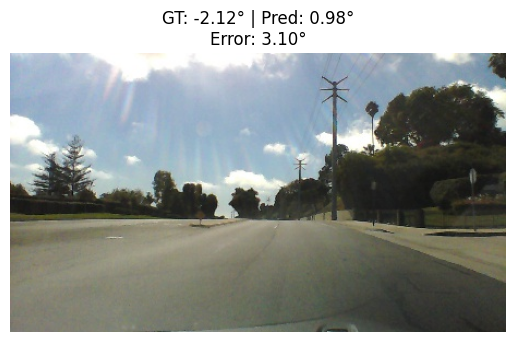

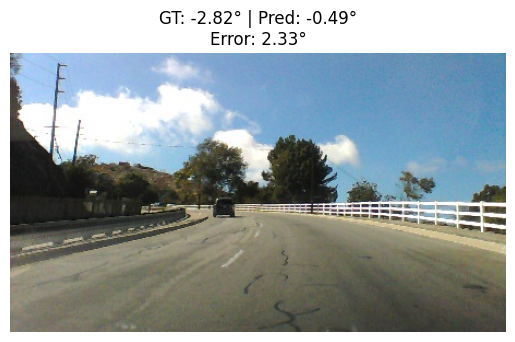

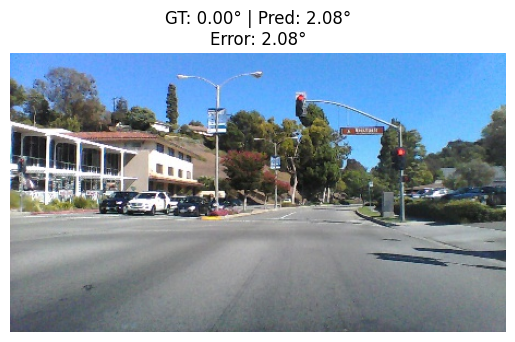

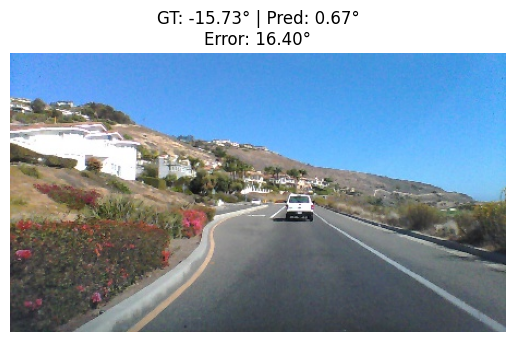

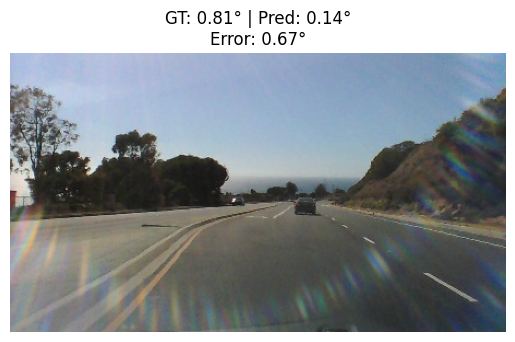

In [71]:
import matplotlib.pyplot as plt
import torchvision.transforms as transforms
from PIL import Image
import torch

vit_model.eval()

transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize([0.5]*3, [0.5]*3)
])

num_samples = 5
for i in range(num_samples):
    img_path = val_df.iloc[i]["image_path"]
    true_angle = val_df.iloc[i]["angle"]

    image = Image.open(img_path).convert("RGB")
    input_tensor = transform(image).unsqueeze(0).to(device)

    with torch.no_grad():
        predicted_angle = model(input_tensor).item()

    error = abs(predicted_angle - true_angle)

    plt.figure()
    plt.imshow(image)
    plt.title(f"GT: {true_angle:.2f}° | Pred: {predicted_angle:.2f}°\nError: {error:.2f}°")
    plt.axis("off")
    plt.show()

Test on Source A — MAE: 14.7592, RMSE: 30.0231


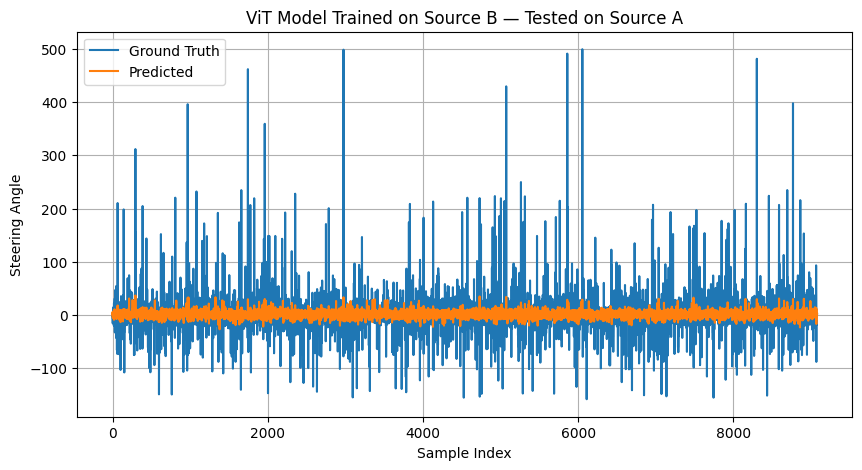

In [72]:
from sklearn.metrics import mean_absolute_error, mean_squared_error
vit_model.eval()

true_angles = []
pred_angles = []

with torch.no_grad():
    for images, angles in source_a_val_loader:
        images = images.to(device)
        angles = angles.numpy()
        outputs = vit_model(images).squeeze(1).cpu().numpy()

        true_angles.extend(angles)
        pred_angles.extend(outputs)

mae = mean_absolute_error(true_angles, pred_angles)
mse = mean_squared_error(true_angles, pred_angles)
rmse = mse ** 0.5

print(f"Test on Source A — MAE: {mae:.4f}, RMSE: {rmse:.4f}")

plt.figure(figsize=(10, 5))
plt.plot(true_angles, label="Ground Truth")
plt.plot(pred_angles, label="Predicted")
plt.title("ViT Model Trained on Source B — Tested on Source A")
plt.xlabel("Sample Index")
plt.ylabel("Steering Angle")
plt.legend()
plt.grid(True)
plt.show()

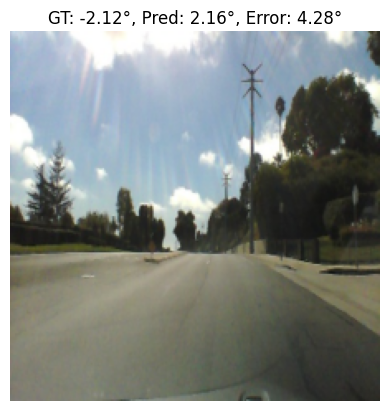

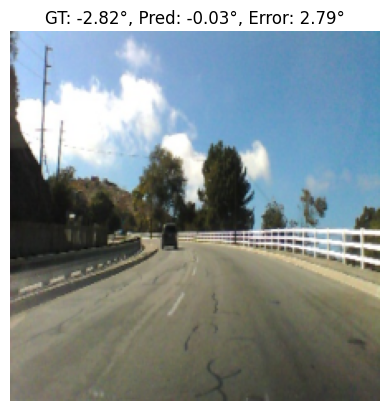

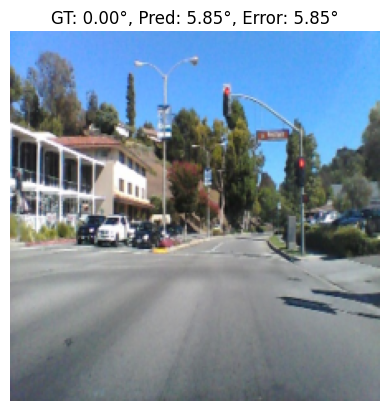

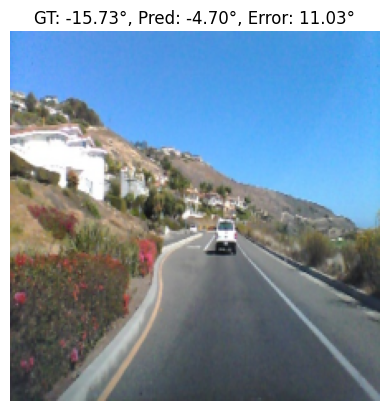

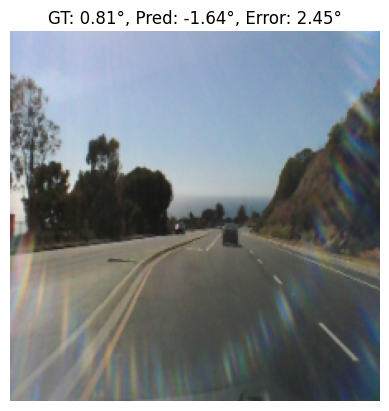

In [73]:
import matplotlib.pyplot as plt
import torchvision.transforms.functional as F
import torch

model.eval()

# How many images to show
num_images = 5
shown = 0

with torch.no_grad():
    for images, angles in source_a_val_loader:
        images = images.to(device)
        outputs = vit_model(images).squeeze(1).cpu()
        angles = angles.cpu()

        for i in range(images.size(0)):
            if shown >= num_images:
                break

            img = F.to_pil_image(images[i] * 0.5 + 0.5)  # unnormalize for display
            true_angle = angles[i].item()
            pred_angle = outputs[i].item()
            error = abs(pred_angle - true_angle)

            plt.figure()
            plt.imshow(img)
            plt.title(f"GT: {true_angle:.2f}°, Pred: {pred_angle:.2f}°, Error: {error:.2f}°")
            plt.axis("off")
            plt.show()

            shown += 1
        if shown >= num_images:
            break

# Swin ViT

In [26]:
import torch
from torch import nn
from torch.utils.data import DataLoader
from torchvision import transforms
from timm import create_model
from tqdm import tqdm

In [32]:
import torch
import torch.nn as nn
import torch.optim as optim
from timm import create_model

class SwinRegressor(nn.Module):
    def __init__(self):
        super(SwinRegressor, self).__init__()
        # Load Swin-B pretrained on ImageNet, remove classifier head
        self.backbone = create_model('swin_base_patch4_window7_224', pretrained=True, num_classes=0)
        # Add regression head
        self.regressor = nn.Sequential(
            nn.Linear(self.backbone.num_features, 256),
            nn.ReLU(),
            nn.Linear(256, 1)
        )

    def forward(self, x):
        x = self.backbone(x)
        x = self.regressor(x)
        return x

# ----------------------------
# Training Loop (matches your style)
# ----------------------------

device = torch.device("cpu")
model = SwinRegressor().to(device)

criterion = nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=1e-4)

num_epochs = 10

for epoch in range(num_epochs):
    model.train()
    running_loss = 0.0

    for i, (images, angles) in enumerate(train_loader):
        images = images.to(device)
        angles = angles.to(device).unsqueeze(1)

        outputs = model(images)
        loss = criterion(outputs, angles)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        running_loss += loss.item() * images.size(0)

        if i % 10 == 0:
            print(f"[Epoch {epoch+1} | Batch {i}] Loss: {loss.item():.4f}")

    epoch_loss = running_loss / len(train_loader.dataset)

    # Validation
    model.eval()
    val_loss = 0.0
    with torch.no_grad():
        for images, angles in val_loader:
            images = images.to(device)
            angles = angles.to(device).unsqueeze(1)
            outputs = model(images)
            loss = criterion(outputs, angles)
            val_loss += loss.item() * images.size(0)

    val_loss /= len(val_loader.dataset)
    print(f"Epoch {epoch+1}/{num_epochs} - Train Loss: {epoch_loss:.4f}, Val Loss: {val_loss:.4f}")

[Epoch 1 | Batch 0] Loss: 2137.7095
[Epoch 1 | Batch 10] Loss: 916.0142
[Epoch 1 | Batch 20] Loss: 222.9577
[Epoch 1 | Batch 30] Loss: 736.7780
[Epoch 1 | Batch 40] Loss: 1908.7617
[Epoch 1 | Batch 50] Loss: 107.6124
[Epoch 1 | Batch 60] Loss: 452.3110
[Epoch 1 | Batch 70] Loss: 639.1737
[Epoch 1 | Batch 80] Loss: 913.8601
[Epoch 1 | Batch 90] Loss: 163.4970
[Epoch 1 | Batch 100] Loss: 218.3799
[Epoch 1 | Batch 110] Loss: 508.8329
[Epoch 1 | Batch 120] Loss: 250.6720
[Epoch 1 | Batch 130] Loss: 945.5382
[Epoch 1 | Batch 140] Loss: 1252.8417
[Epoch 1 | Batch 150] Loss: 676.6917
[Epoch 1 | Batch 160] Loss: 1641.5260
[Epoch 1 | Batch 170] Loss: 944.1907
[Epoch 1 | Batch 180] Loss: 310.6742
[Epoch 1 | Batch 190] Loss: 99.9169
[Epoch 1 | Batch 200] Loss: 552.8015
[Epoch 1 | Batch 210] Loss: 93.3579
[Epoch 1 | Batch 220] Loss: 1280.0809
[Epoch 1 | Batch 230] Loss: 191.0611
[Epoch 1 | Batch 240] Loss: 141.4483
[Epoch 1 | Batch 250] Loss: 786.7224
[Epoch 1 | Batch 260] Loss: 1457.7393
[Epoch 1

In [33]:
torch.save(model.state_dict(), "swin_model_vit_sourceb.pth")  # name it based on model and dataset

Test on Source A — MAE: 11.0800, RMSE: 26.1551


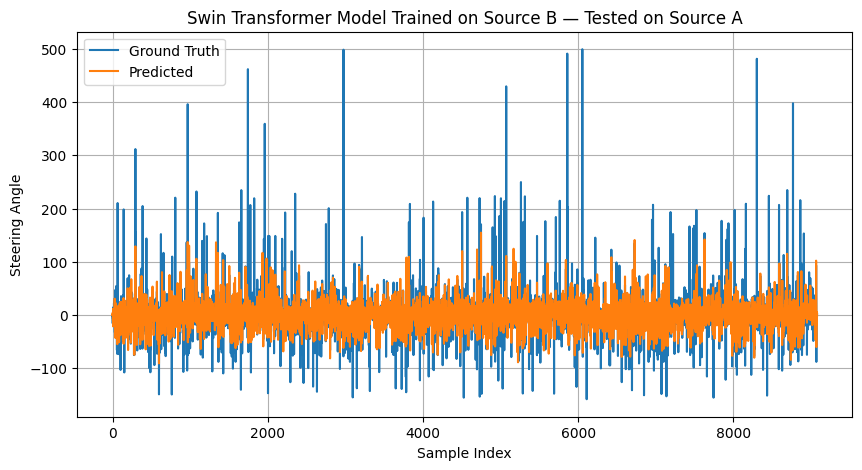

In [35]:
from sklearn.metrics import mean_absolute_error, mean_squared_error
model.eval()

true_angles = []
pred_angles = []

with torch.no_grad():
    for images, angles in source_a_val_loader:
        images = images.to(device)
        angles = angles.numpy()
        outputs = model(images).squeeze(1).cpu().numpy()

        true_angles.extend(angles)
        pred_angles.extend(outputs)

mae = mean_absolute_error(true_angles, pred_angles)
mse = mean_squared_error(true_angles, pred_angles)
rmse = mse ** 0.5

print(f"Test on Source A — MAE: {mae:.4f}, RMSE: {rmse:.4f}")

plt.figure(figsize=(10, 5))
plt.plot(true_angles, label="Ground Truth")
plt.plot(pred_angles, label="Predicted")
plt.title("Swin Transformer Model Trained on Source B — Tested on Source A")
plt.xlabel("Sample Index")
plt.ylabel("Steering Angle")
plt.legend()
plt.grid(True)
plt.show()

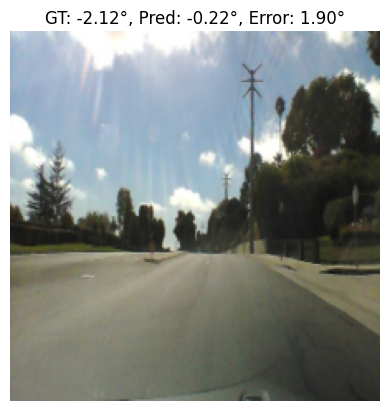

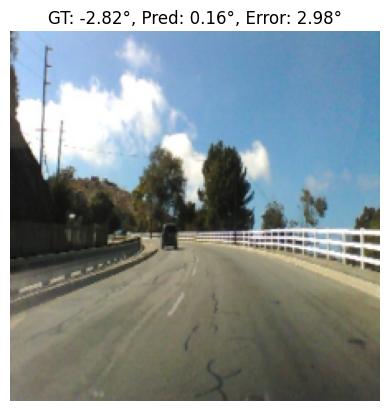

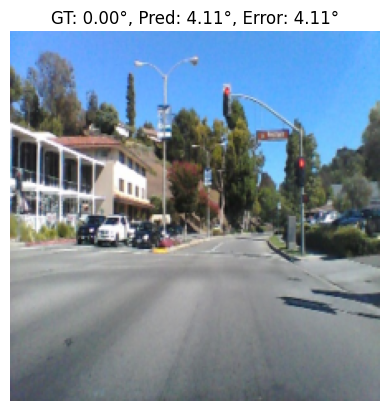

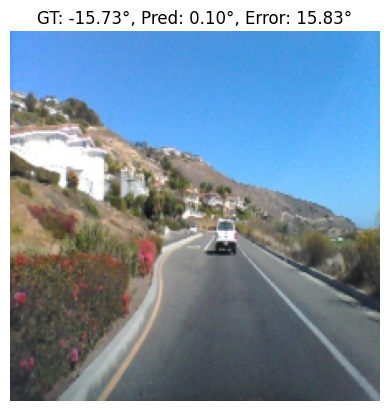

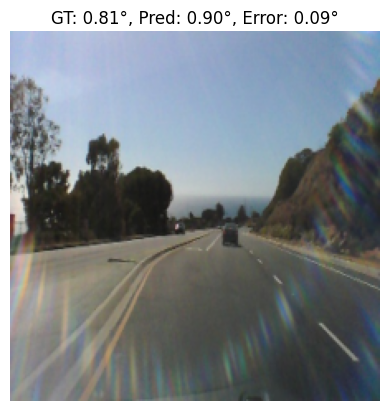

In [37]:
import matplotlib.pyplot as plt
import torchvision.transforms.functional as F
import torch

model.eval()

num_images = 5
shown = 0

with torch.no_grad():
    for images, angles in source_a_val_loader:
        images = images.to(device)
        outputs = model(images).squeeze(1).cpu()
        angles = angles.cpu()

        for i in range(images.size(0)):
            if shown >= num_images:
                break

            img = F.to_pil_image(images[i] * 0.5 + 0.5)  # unnormalize for display
            true_angle = angles[i].item()
            pred_angle = outputs[i].item()
            error = abs(pred_angle - true_angle)

            plt.figure()
            plt.imshow(img)
            plt.title(f"GT: {true_angle:.2f}°, Pred: {pred_angle:.2f}°, Error: {error:.2f}°")
            plt.axis("off")
            plt.show()

            shown += 1
        if shown >= num_images:
            break

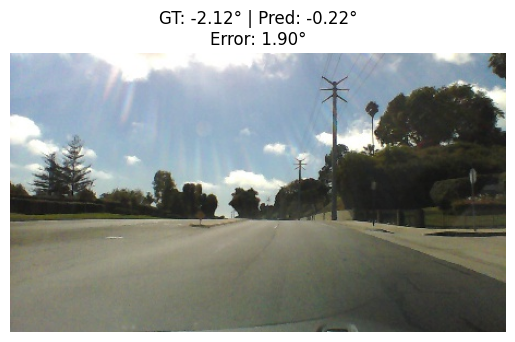

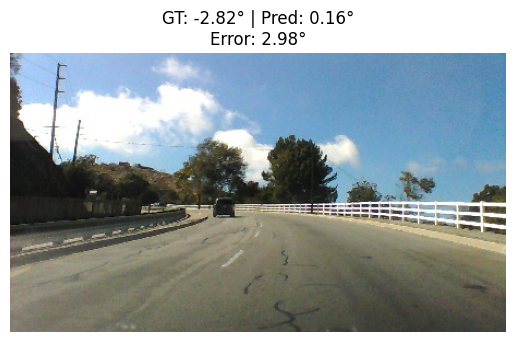

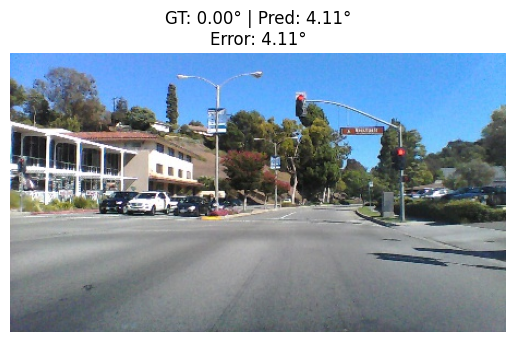

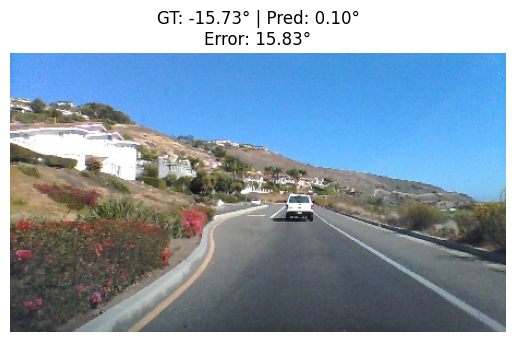

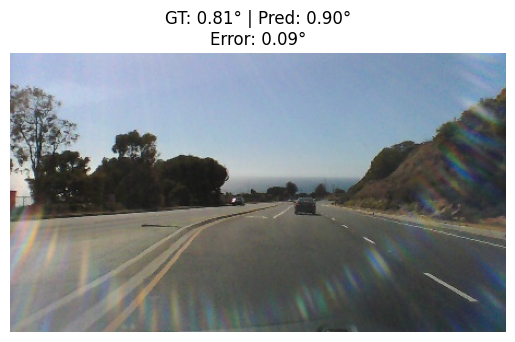

In [38]:
import matplotlib.pyplot as plt
import torchvision.transforms as transforms
from PIL import Image
import torch

model.eval()

transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize([0.5]*3, [0.5]*3)
])

num_samples = 5
for i in range(num_samples):
    img_path = val_df.iloc[i]["image_path"]
    true_angle = val_df.iloc[i]["angle"]

    image = Image.open(img_path).convert("RGB")
    input_tensor = transform(image).unsqueeze(0).to(device)

    with torch.no_grad():
        predicted_angle = model(input_tensor).item()

    error = abs(predicted_angle - true_angle)

    plt.figure()
    plt.imshow(image)
    plt.title(f"GT: {true_angle:.2f}° | Pred: {predicted_angle:.2f}°\nError: {error:.2f}°")
    plt.axis("off")
    plt.show()